In [ ]:
!pip install plotly-express

## Israel  Real estate project 



## Predicing Real estate Price


  What is price distrubution?

  What is the price distribution per city?

  What is the price ternd over 2 years - is the same trend exist in city level?

  Is there a link between the city level measurment for example :socio economey rank , population rank and the real state price?

  Can Real estate Ads help to etimate their price ?

  How fast real estates are sold?

  Is there  a difference in the text of inexpensive and expensive real estate?

  What are the main feature impacting the price prediction?

  We built an interactive map with an interactive graph for a simple view.
  In one click the user can city the city ranking, pollution and Altair graph of the monthly price trends over two years 


  Our source for information are: (Hebrew )


1.  https://www.ad.co.il/nadlansale 
2.  https://www.ad.co.il/nadlanprice
3. 'https://he.wikipedia.org/wiki/%D7%93%D7%99%D7%A8%D7%95%D7%92_%D7%A8%D7%A9%D7%95%D7%99%D7%95%D7%AA_%D7%9E%D7%A7%D7%95%D7%9E%D7%99%D7%95%D7%AA_%D7%91%D7%99%D7%A9%D7%A8%D7%90%D7%9C'
4. Nominatim


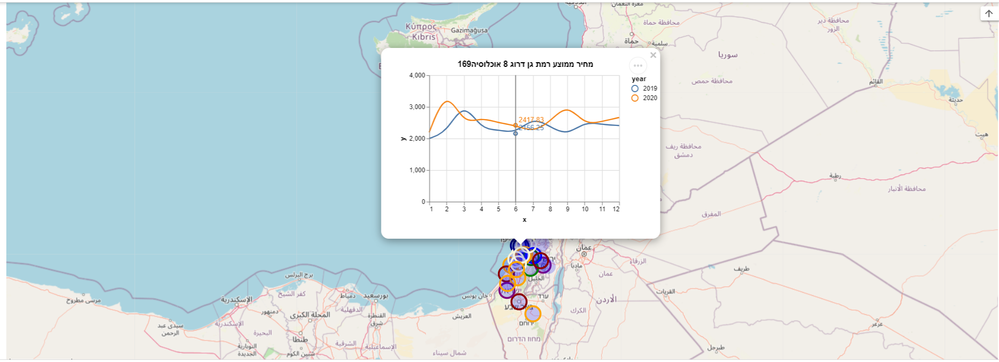

In [108]:

!pip install turicreate
!pip install folium
!pip install python-bidi
!pip install spaCy
!pip install afinn
#!pip install tensorflow_text

In [109]:
!pip install numpy 

In [110]:
import plotly.express as px  # sometimes need to run Twice ..()

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import geopandas as gpd
from bs4 import BeautifulSoup
from pathlib import Path
import time
import numpy as np
from tqdm import tqdm
import pandas as pd
import requests
import logging
import argparse
import dateutil
import turicreate.aggregate as agg
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from wordcloud import WordCloud
import re
from collections import Counter
import re
import nltk
import turicreate as tc
from nltk.tokenize import word_tokenize

from wordcloud import WordCloud
from matplotlib import pyplot as plt
from bidi.algorithm import get_display
from scipy.stats import norm
import operator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from google.colab import drive
import turicreate.aggregate as agg
import folium
from sklearn.feature_extraction.text import TfidfVectorizer
from geopy.geocoders import Nominatim
from folium.plugins import MarkerCluster
import ast
import altair as alt
import warnings
warnings.filterwarnings('ignore')

Function for pre processing

In [113]:
def get_datetime(dt_str):
    try:
        return dateutil.parser.parse(dt_str)
    except:
        return None

def preprocess_text(text):
    """ Preprocess text, remove signs 
        some punctuations removed with space instead and some without (for example ! removed without)  
        Args:
            text: the text to remove from
        Returns:
            text : the cleaned text
    """
    REPLACE_NO_SPACE = re.compile("(\.)|(\;)|(\:)|(\!)|(\')|(\?)|(\,)|(\")|(\()|(\))|(\[)|(\])")
    REPLACE_WITH_SPACE = re.compile("(<br\s*/><br\s*/>)|(\-)|(\n)|(\r)| (\/)") 
    text = REPLACE_NO_SPACE.sub("", text.lower())
    text = REPLACE_WITH_SPACE.sub(" ", text)

    return text

def normalize_text(text, stop_words = None, remove_stop_words = False):
    """ Normalize text- lower case, remove signs, stop_words, single letter words and more
        Args:
            text: the text to clean
            stop_words: boolean indicating whether to remove stop words
        Returns:
            text : the cleaned text
    """
    text = preprocess_text(text)
    # remove words that contain numbers
    text = word_tokenize(text)
    if remove_stop_words: # remove stop words
      text = [x for x in text if x not in stop_words]
    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    text = " ".join(text)
    text = re.sub("\n|\r", "", text)
    text = re.sub("<br>", "", text)
    return text

def remove_html_tags(text):
    clean = re.compile('<.*?>')
    return(re.sub(clean, '', text))  

## Real state sales data

In [114]:
sf=tc.SFrame.read_csv('realestate_datamiri6.csv')
sf=sf.unique()
sf= sf.dropna(['address', 'city','num_rooms','price'])
sf['datet'] = sf['date'].apply(lambda dt_str: get_datetime(dt_str))
sf['Year'] = sf['datet'].apply(lambda dt: dt.year)
sf['Month'] = sf['datet'].apply(lambda dt: dt.month)
sf['cityr'] = sf['city'].apply(lambda t: t[::-1]) # handle hebrew right to left 
sf['price'] = sf['price'] / 1000
sf['price_per_metre'] = sf['price_per_metre']/1000
sf.shape

Finished parsing file /content/drive/Shareddrives/BigData/realestate_datamiri6.csv

Parsing completed. Parsed 100 lines in 2.10581 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,str,str,int,int,int,int,int,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/drive/Shareddrives/BigData/realestate_datamiri6.csv

Parsing completed. Parsed 144577 lines in 0.838979 secs.

(134940, 13)

Lets look on the data per year

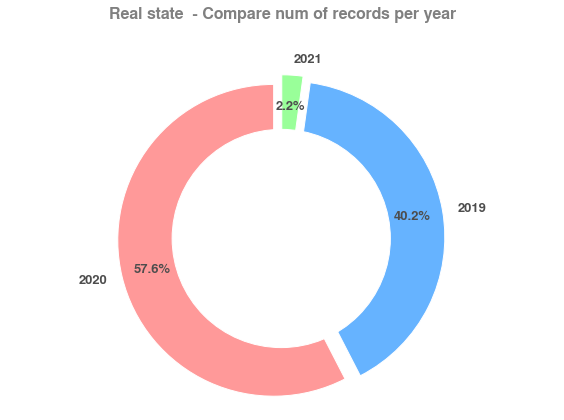

In [115]:
# Plot the results of the gender inference comparison
dff=sf.to_dataframe() 
countperyear = dff['Year'].value_counts()/len(dff)
# Pie chart
labels = list(countperyear.index)
sizes = list(countperyear)
#colors
colors = ['#ff9999','#66b3ff','#99ff99']
#explsion
explode = (0.05,0.05,0.05) 
fig1, ax1 = plt.subplots(figsize=(8, 6))
patches, texts, autotexts = ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.80, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
ax1.set_title("Real state  - Compare num of records per year", pad=40, fontdict={'fontsize': 16,'color' : 'gray'})
for t in texts: t.set_fontsize(13)
for t in texts: t.set_color('0.3')
for a in autotexts: a.set_fontsize(13)
for a in autotexts: a.set_color('0.3')
plt.tight_layout()
plt.show()

Most of the records are from 2019,2020 and around 2% for 2021.
Lets foucs on 2019,2020

In [116]:
sf=sf[sf['Year']<= 2020]

##  Real estate Price


  What is price distrubution?

  What is the price distribution per city?

  What is the price ternd over 2 years - is the same trend exist in city level?

  Is there a link between the city level measurment for example :socio economey rank , population rank and the real state price?


  We built an interactive map with an interactive graph for a simple view.
  In once click the user can city the city ranking, pollution and Altair graph of the monthly price trends over two years 

  

 EDA and Cleaning 


 mu = 1496.64 and sigma = 1072.14



Text(0.5, 1.0, 'Price distribution')

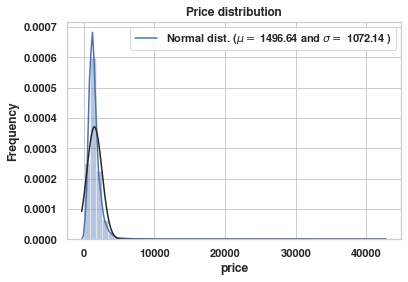

In [117]:
dff=sf.to_dataframe() 
sns.distplot(dff['price'] , fit=norm);
# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(dff['price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Price distribution')

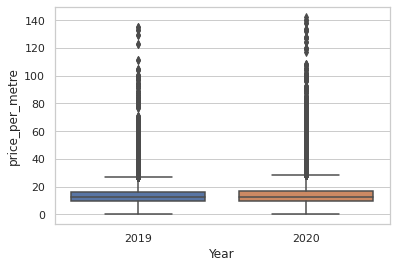

In [118]:
sns.set_theme(style="whitegrid")

ax = sns.boxplot(x="Year",y='price_per_metre',data = dff)

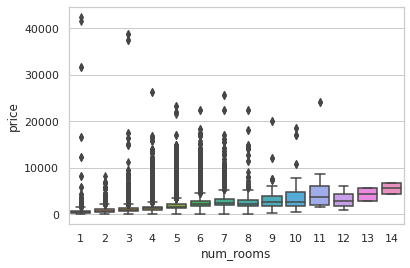

In [119]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x="num_rooms",y='price',data = dff)

We can clearly see that the varibales skewed up , meaning most of the data centred at the bottom part with fewer obeservation in the top part.This can be due to un valid data ot due to some special relastate that dont present most of the real state in Isreal.  for example real state with 12 room !!!! or 1 room with price over 4M.


###  Does Construction Year Play A Role?

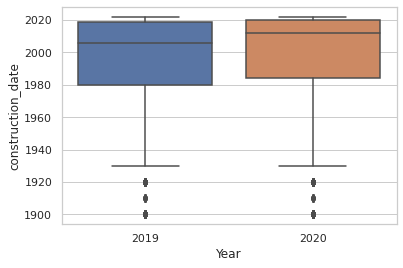

In [120]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x="Year",y='construction_date',data = dff)

Well the y axis value (the construction year ) looks suspicious -(1900??)
Lets take a closer look

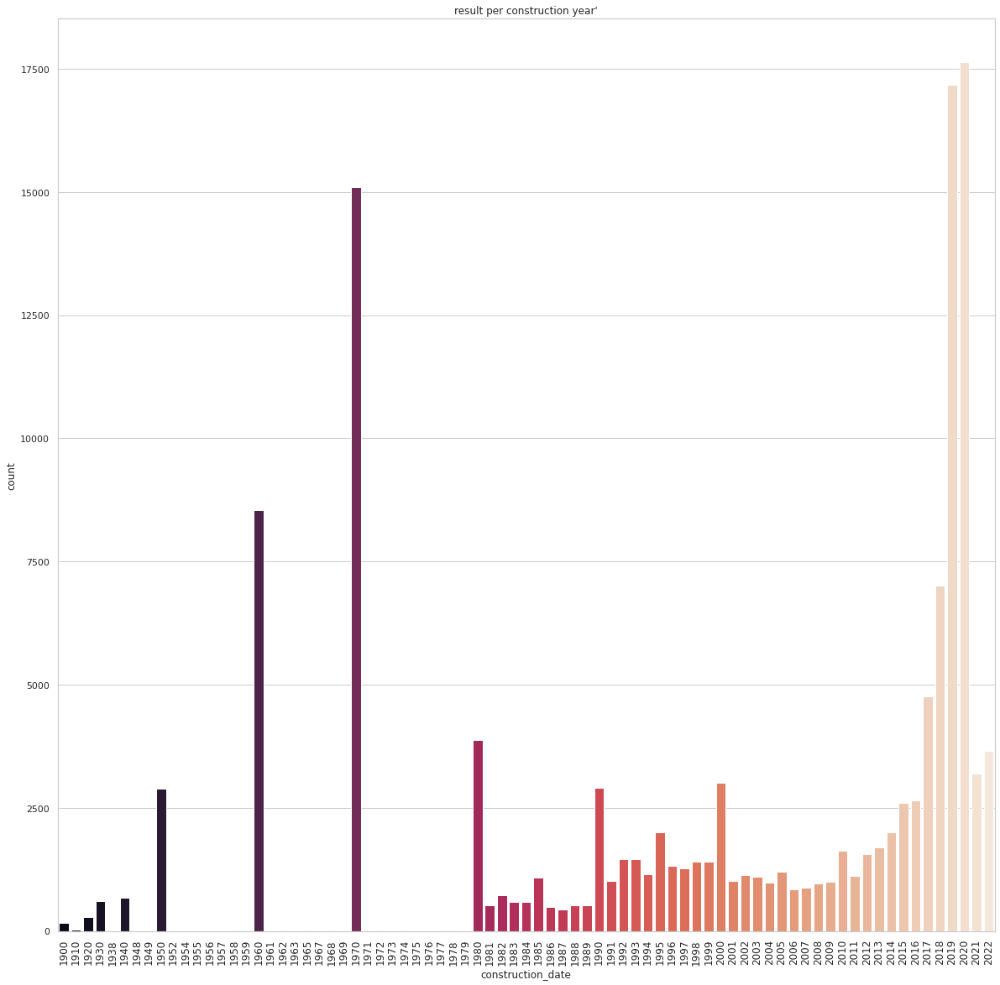

In [121]:
plt.figure(figsize=[20,20])
g = sns.countplot(x="construction_date", data=dff, palette="rocket")
g.set_title ("result per construction year'")
for label in g.get_xticklabels():
    label.set_rotation(90) 
    label.set_fontsize('medium')


Most of the realstate were built from 1979 - we have few very old ( maybe something with the data - we will check them ..) 
We can see the big jump  in the last few years , maximum are in 2019

In [122]:
# Check the real state with oldest data - what cities have real state with 1900 value in construction year 
ds =dff[dff['construction_date']== 1900]
ds

,address,city,construction_date,date,floor,num_rooms,price,price_per_metre,sq_metres,datet,Year,Month,cityr
2780,המעלות 11,ירושלים,1900,05/6/2019,1.0,2,33.667,0.480,70.0,2019-05-06,2019,5,םילשורי
5402,בר יוחאי 60,צפת,1900,18/7/2019,NaN,4,1400.000,10.144,138.0,2019-07-18,2019,7,תפצ
6239,,גלגל,1900,13/10/2020,NaN,1,160.000,2.285,70.0,2020-10-13,2020,10,לגלג
6369,,עכו,1900,06/1/2020,NaN,1,21.832,0.532,41.0,2020-06-01,2020,6,וכע
7071,נפתלי 4,קרית גת,1900,01/8/2019,3.0,4,835.770,10.069,83.0,2019-01-08,2019,1,תג תירק
...,...,...,...,...,...,...,...,...,...,...,...,...,...
128023,איילה 8,באר יעקב,1900,29/3/2020,NaN,3,2500.000,25.000,100.0,2020-03-29,2020,3,בקעי ראב
129853,טירה - ללא רחוב 1,טירה,1900,19/5/2020,1.0,1,1700.000,NaN,1.0,2020-05-19,2020,5,הריט
130372,דגניה א,דגניה א',1900,25/12/2020,1.0,4,50.000,0.500,100.0,2020-12-25,2020,12,'א הינגד
130406,עין כרם 26,ירושלים,1900,28/8/2020,1.0,5,4038.000,32.829,123.0,2020-08-28,2020,8,םילשורי


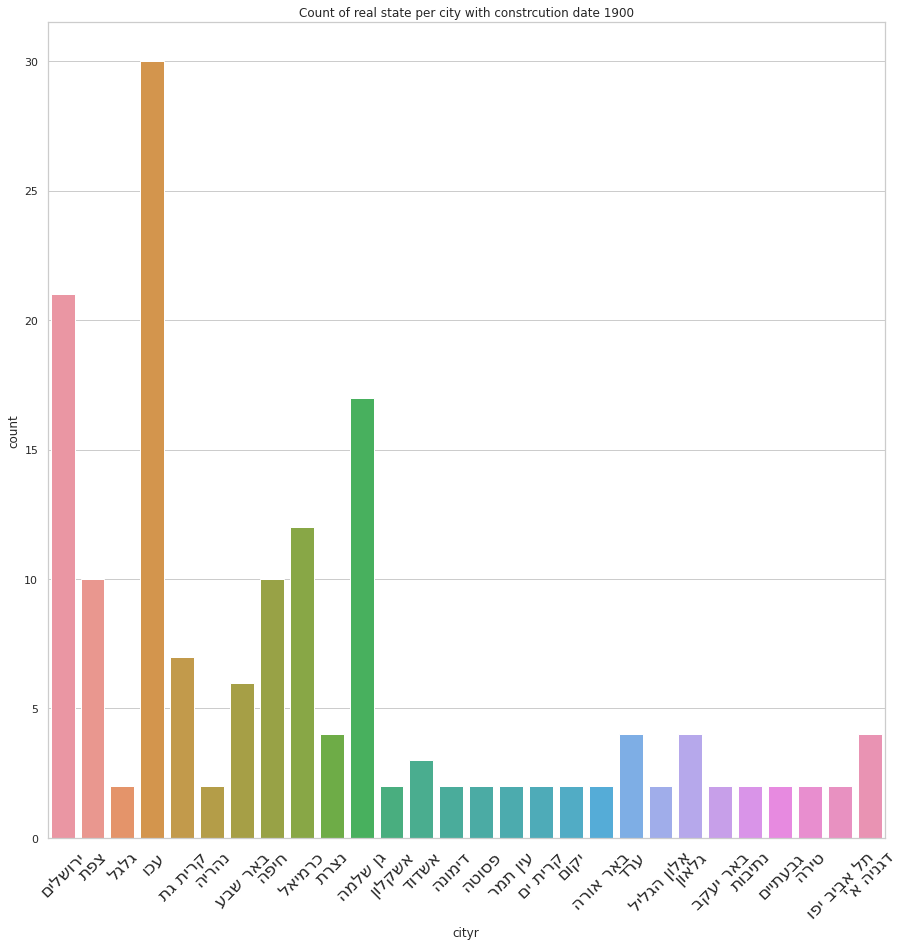

In [123]:
plt.figure(figsize=[15,15])
g = sns.countplot(x="cityr", data=ds)
g.set_title ("Count of real state per city with constrcution date 1900")
for label in g.get_xticklabels():
    label.set_rotation(45) 
    label.set_fontsize('x-large')

We can see few cities like ירושלים that  might have very old construction date BUT  Tel - aviv ? It look like some outlier we will drop them.
Lets foucs on real state from 1980 - and see the price trends from 2019 2020 2021 

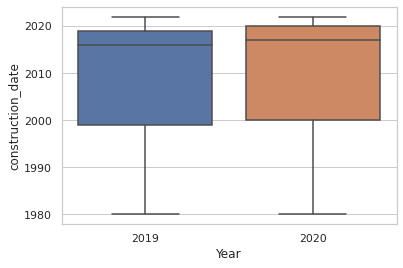

In [124]:
sfn=tc.SFrame(dff)
sfn=sfn[sfn['construction_date'] >= 1980]
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x="Year",y='construction_date',data = sfn.to_dataframe())

Looks better after our cleaning .
Lets remove also real state with more than 8 rooms and rows without city value 

In [125]:
sfn = sfn[sfn['num_rooms']< 9]
sfn = sfn[sfn['city'] != ""]
sfn.shape

(103245, 13)

### **Real state - cities view**

  What are the top 10 ,top 40 cities that had highest real state sales from 2019 forward?
  What are the cities with the highest\ lowest average  price ?
  Do the cities rank impact the demand for real state ?

  **To answer the last quetion we scrap the cities ranking from  wikipedia site** for :
דירוג רשויות מקומיות בישראל

הדרוג לפי אוכלסיה ,צפיפות אוכלסין לקילומטר רבוע , מדד חברתי כלכלי ומדד גיני 
 

soci economey rank is a measure for  social econmeny level of the population in a city. The rank is between 1-10 . 10 is the maximal value for example סביון וכפר שמריהו has rank 10 


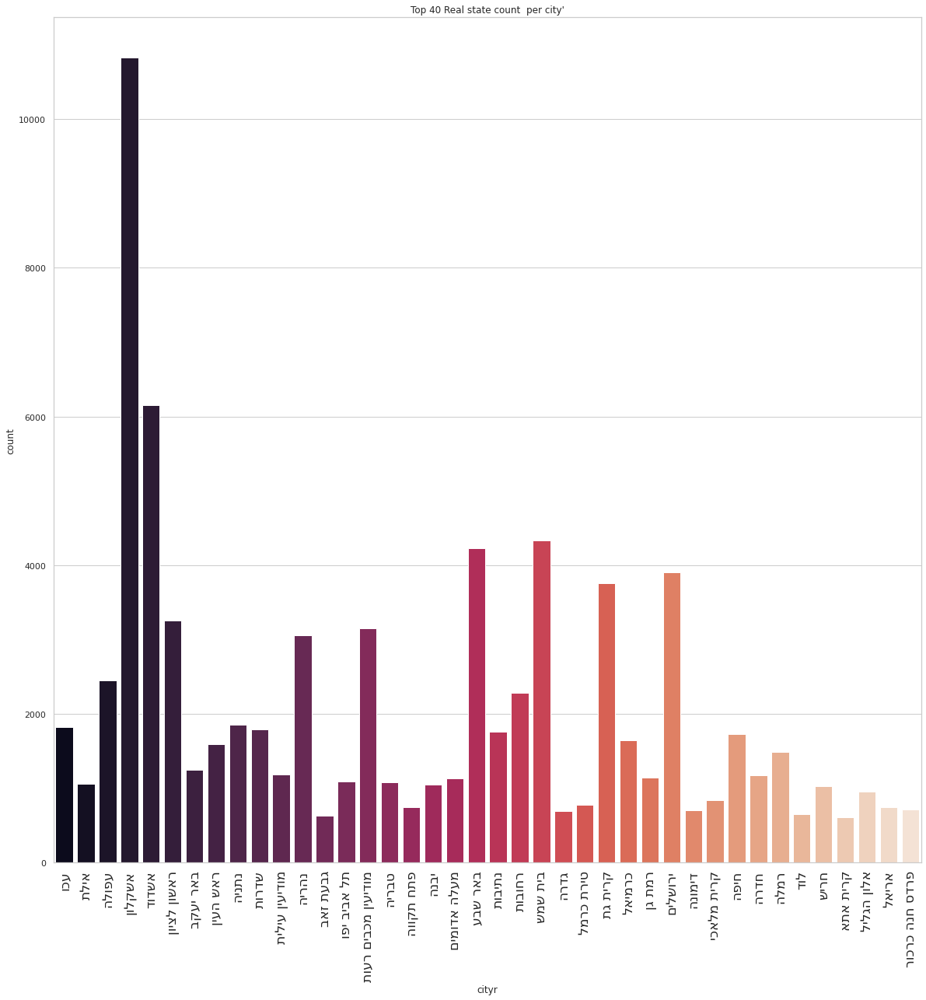

In [126]:
# get the 40 top 
g= sfn.groupby ('city',{'count':agg.COUNT()})
d= g.sort ('count',ascending = False)
d=d.to_dataframe()
d=d[0:40]
dl=list(d['city'])
sfd40=sfn.to_dataframe()
sfd40 = sfd40[sfd40['city'].isin(dl)]
plt.figure(figsize=[20,20])
g = sns.countplot(x="cityr", data=sfd40, palette="rocket")
g.set_title ("Top 40 Real state count  per city'")
for label in g.get_xticklabels():
    label.set_rotation(90) 
    label.set_fontsize('x-large')


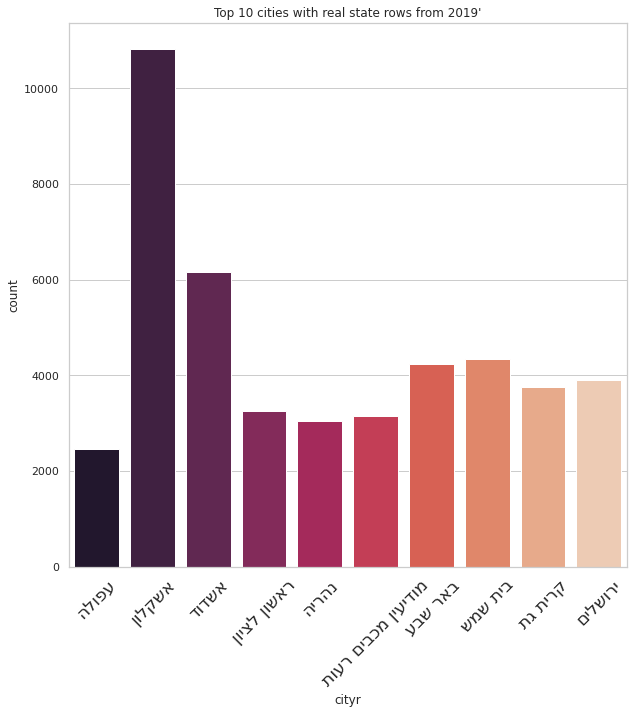

In [127]:
# top 10 cities 
d=d[0:10]
dl=list(d['city'])
df10 = sfd40[sfd40['city'].isin(dl)]
plt.figure(figsize=[10,10])
g = sns.countplot(x="cityr", data=df10, palette="rocket")
g.set_title ("Top 10 cities with real state rows from 2019'")
for label in g.get_xticklabels():
    label.set_rotation(45) 
    label.set_fontsize('x-large')

### Wiki scraping for cities ranking 


 The city name in the wiki and in our real state data didnt match for all cities for example: 
 "תל אביב -יפו":"תל אביב יפו" so we built a function get_city to align the city name 

In [128]:

url='https://he.wikipedia.org/wiki/%D7%93%D7%99%D7%A8%D7%95%D7%92_%D7%A8%D7%A9%D7%95%D7%99%D7%95%D7%AA_%D7%9E%D7%A7%D7%95%D7%9E%D7%99%D7%95%D7%AA_%D7%91%D7%99%D7%A9%D7%A8%D7%90%D7%9C'

# get URL
page = requests.get(url)

# scrape webpage
soup = BeautifulSoup(page.content, 'html.parser')
 
city_dict = {'name': [], 'name_type': [], 'district': [], 'pop_rank': [], 'population': [], 'pop_density': [],
            'Gini_coef': [],'soci_econ_rank': []}
for tr in soup.find_all('tr'):
    tds = tr.find_all('td')
    if tds:
        city_dict['name'].append(tds[0].text)
        city_dict['name_type'].append(tds[1].text)
        city_dict['district'].append(tds[2].text)
        city_dict['pop_rank'].append(tds[3].text)
        #city_dict['population'].append(tds[4].text)
        city_dict['population'].append(tds[4].text.replace(',', ''))
        city_dict['pop_density'].append(tds[8].text.replace(',', '')) 
        city_dict['Gini_coef'].append(tds[10].text)
        city_dict['soci_econ_rank'].append(tds[11].text)
        
   
citydf = pd.DataFrame.from_dict(city_dict).drop_duplicates()
citydfsf=tc.SFrame(citydf)
citydfsf.rename({"name":'city'},inplace = True)

def get_city(name):
  if name =="תל אביב -יפו":
    val = "תל אביב יפו"    
  else:
    t=name.split()
    if len(t) == 2:
      if t[0] == "קריית":
        val = "קרית " + t[1]
      else:
         val = name.replace("-", " ")   
    else:
      val = name.replace("-", " ")    
  return val
citydfsf['city'] = citydfsf['city'].apply(lambda t: get_city(t))
h= get_city ("תל אביב -יפו")
citydfsf

city,name_type,district,pop_rank,population,pop_density,Gini_coef,soci_econ_rank
ירושלים,עירייה,ירושלים,1,966346,7705,0.4405,3
תל אביב יפו,עירייה,תל אביב,2,468809,9045,0.5030,8
חיפה,עירייה,חיפה,3,282751,4372,0.4906,7
ראשון לציון,עירייה,המרכז,4,256645,4360,0.4399,7
פתח תקווה,עירייה,המרכז,5,252164,7059,0.4416,7
אשדוד,עירייה,הדרום,6,225916,4897,0.4319,4
נתניה,עירייה,המרכז,7,225156,7753,0.4461,6
בני ברק,עירייה,תל אביב,8,213118,29154,0.4083,2
באר שבע,עירייה,הדרום,9,211393,1802,0.4438,5
חולון,עירייה,תל אביב,10,196691,10320,0.4231,7


Now lets add the city information to our real state data for the top 10 cities and top 40 to answer the question if the real state demands has relation to the city ranking ? What is the ranking for the top 10 cities ? do all of them has high soci-economey ranking?

We used ploty for interactive graph - clicking will give addtional information per city including popluation rank and Gini - coef

In [129]:
sf10=tc.SFrame(df10)
sf10= sf10.fillna('price_per_metre', 0)  
print (sf10.shape)
#g = sf10.groupby(["city"], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
df10wik=sf10.join(citydfsf,'city',how='inner')
df10wik['soci_econ_rank'] =df10wik['soci_econ_rank'].astype(int)
df10wik['pop_rank'] =df10wik['pop_rank'].astype(int)
df10wik['pop_density'] =df10wik['pop_density'].astype(float)
df10wik['population'] =df10wik['population'].astype(float)
df10wik['Gini_coef'] =df10wik['Gini_coef'].astype(float)
df10wik.materialize()
df10wik.shape

(45124, 13)


(45124, 20)

In [130]:
# top 10 are 
plt.figure(figsize=[10,10])
g = df10wik.groupby(["city",'Gini_coef','soci_econ_rank','pop_rank'], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
fig = px.bar(g, x='city', y='Count',text="soci_econ_rank",
             hover_data=['Gini_coef', 'soci_econ_rank','pop_rank'], color='soci_econ_rank',
             labels={'Count':'rows per city'}, height=400)
fig.show()

<Figure size 720x720 with 0 Axes>

We can see  for  the top 10 cities  that
Most of them with socio economic rank below 8 beside "מודיעין מכבים רעות"  that has a rank of 9 ( Maximum is 10)

In [131]:
#Lets do the same for our top40 cities 
sfd40=tc.SFrame(sfd40)
sfd40= sfd40.fillna('price_per_metre', 0)  
print (sfd40.shape)
#g = sf10.groupby(["city"], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
df40wik=sfd40.join(citydfsf,'city',how='inner')
df40wik['soci_econ_rank'] =df40wik['soci_econ_rank'].astype(int)
df40wik['pop_rank'] =df40wik['pop_rank'].astype(int)
df40wik['pop_density'] =df40wik['pop_density'].astype(float)
df40wik['population'] =df40wik['population'].astype(float)
df40wik['Gini_coef'] =df40wik['Gini_coef'].astype(float)
df40wik.materialize()
df40wik.shape

(80381, 13)


(79420, 20)

In [132]:
# 40 cities their scocio economy rank and the count of real state rows
plt.figure(figsize=[10,10])
g = df40wik.groupby(["city",'Gini_coef','soci_econ_rank','pop_rank'], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
fig = px.bar(g, x='city', y='Count',text="soci_econ_rank",
             hover_data=['Gini_coef', 'soci_econ_rank','pop_rank'], color='soci_econ_rank',
             labels={'Count':'rows per city'}, height=400)
fig.show()

<Figure size 720x720 with 0 Axes>

Price ditrubtion compare between the top 40 cities with high price?

In [133]:
# top 40 cities Average price and the city Gini coef
plt.figure(figsize=[10,10])

g = df40wik.groupby(["city",'Gini_coef','soci_econ_rank','pop_rank','population'], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
fig = px.bar(g, x='city', y='Avr price',text="soci_econ_rank",
             hover_data=['Gini_coef', 'soci_econ_rank','population'], color='pop_rank',
             labels={'Count':'rows per city'}, height=400)
fig.show()

<Figure size 720x720 with 0 Axes>

We can see that most cities with high average price has high soci-economey rank (תל אביב ,רמת גן , פתח תקווה) But ירושלים - show this is not always correct since the city has rank 3 and its the third city with high average price

What is the most expensive real state in the data?

What is the cheapest real state in the data ?

What is the average price for real state ?

In [134]:
sfn= df40wik
print ('Avaerge real state price ',int (sfn['price'].mean()))
print ("The most expensive real state " ,sfn[sfn['price'].argmax()])
print ("The most cheapest real state " ,sfn[sfn['price'].argmin()])


Avaerge real state price  1557
The most expensive real state  {'address': 'פעמוני יוסף 12', 'city': 'תל אביב יפו', 'construction_date': 2022, 'date': '19/1/2020', 'floor': 22.0, 'num_rooms': 7, 'price': 25672.173, 'price_per_metre': 73.983, 'sq_metres': 347.0, 'datet': datetime.datetime(2020, 1, 19, 0, 0, tzinfo=GMT +0.0), 'Year': 2020, 'Month': 1, 'cityr': 'ופי ביבא לת', 'name_type': 'עירייה', 'district': 'תל אביב', 'pop_rank': 2, 'population': 468809.0, 'pop_density': 9045.0, 'Gini_coef': 0.503000020980835, 'soci_econ_rank': 8}
The most cheapest real state  {'address': 'סן מרטין 63', 'city': 'לוד', 'construction_date': 1994, 'date': '25/7/2019', 'floor': 2.0, 'num_rooms': 3, 'price': 12.5, 'price_per_metre': 0.208, 'sq_metres': 60.0, 'datet': datetime.datetime(2019, 7, 25, 0, 0, tzinfo=GMT +0.0), 'Year': 2019, 'Month': 7, 'cityr': 'דול', 'name_type': 'עירייה', 'district': 'המרכז', 'pop_rank': 20, 'population': 82883.0, 'pop_density': 6855.0, 'Gini_coef': 0.37880000472068787, 'soci_ec

We can see again invalid data fro example the tel -aviv real state construction date is 2022 while the saleing was done in 2020- let remove this rows

In [135]:
sf1= sfn[sfn['construction_date'] <= sfn['Year']]
sf1.shape

(72097, 20)

### Average Monthly price
Did the price increased dramtically between 2019 to 2020?

To answer we built  Interactive mouse over chart of the average monthly price for 2019,2020

In [136]:
altdf=sf1.groupby (['Year','Month'],{"Avr price": agg.AVG('price')})
altdf= altdf.to_dataframe ()
altdf['Avr price']= altdf['Avr price'].round(2)
p=altdf.pivot(index='Month', columns='Year', values='Avr price')
p['x']=pd.RangeIndex(start=1,stop = 13, name='x')
p.set_index('x', inplace=True)
source = p.reset_index().melt('x', var_name='year', value_name='y')
# Create a selection that chooses the nearest point & selects based on x-value
nearest = alt.selection(type='single', nearest=True, on='mouseover',
                        fields=['x'], empty='none')
# The basic line
line = alt.Chart(source).mark_line(interpolate='basis').encode(
    x='x:Q',
    y='y:Q',
    color='year:N').properties(title='Avr monthly price per year')
# Transparent selectors across the chart. This is what tells us
# the x-value of the cursor
selectors = alt.Chart(source).mark_point().encode(
    x='x:Q',
    opacity=alt.value(0),).add_selection(nearest)
# Draw points on the line, and highlight based on selection
points = line.mark_point().encode(
    opacity=alt.condition(nearest, alt.value(1), alt.value(0)))
# Draw text labels near the points, and highlight based on selection
text = line.mark_text(align='left', dx=5, dy=-5).encode(
    text=alt.condition(nearest, 'y:Q', alt.value(' ')))
# Draw a rule at the location of the selection
rules = alt.Chart(source).mark_rule(color='gray').encode(
    x='x:Q',).transform_filter(nearest)
# Put the five layers into a chart and bind the data
g=alt.layer(line, selectors, points, rules, text).properties(width=300, height=200)
g

alt.LayerChart(...)

We can see that 2020 average monthly price were higer from Jan to may.and from Aug.
In June 2019 was higher (very small differnation ) 
and from Nov 2019,2020  lines are overlapping

Avg monthly price per city for top 10 
Drill down to city level to see if the average monthly price compare between 2019 ,2020 align with what we see in the Graph above


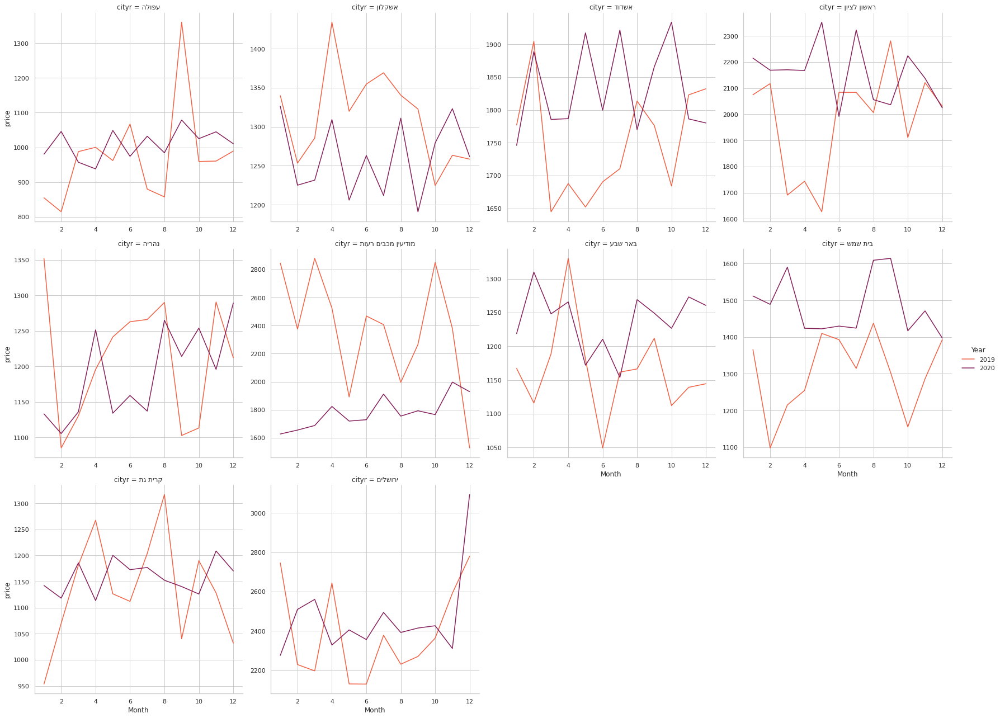

In [137]:
g = sns.FacetGrid(df10wik.to_dataframe(), col = "cityr",
                    height = 6,hue='Year',palette ="rocket_r",col_wrap =4,margin_titles=True, sharex=False, sharey= False)
g.map(sns.lineplot, "Month", "price", ci=None)
g.add_legend()




The Graph below give a view on the price  distribution per city

In [138]:
import plotly.express as px
df40wik['price_log'] = np.log2(df40wik['price'])
fig = px.box(  df40wik.to_dataframe(), x="city", y="price_log", color="city",hover_name="name_type" ,notched=True)
fig.show()

In [139]:
sf1 = sf1[sf1['sq_metres'] < 600] 

Addtional Graph with animation per city beside the location od the point centerd in the right side left side or in the middle per city ... we can also from the construction date see the mix between old real state and new 

In [140]:
data=sf1.to_dataframe()
fig = px.scatter(data, x="price_per_metre", y="sq_metres", animation_frame='city', 
            color="construction_date", hover_name="num_rooms")

fig.show()

We can see from the animation above per city the mixed old real state and new -(yellow colors). For example in חריש most of the real state are new .In ראשון לציון we can see a mixed of new and old (yellow , blue and purple )

### Features correlations


**features correlations and importance**

we will try to recognize features correlation and their affect on the target variable price

**Heatmap**


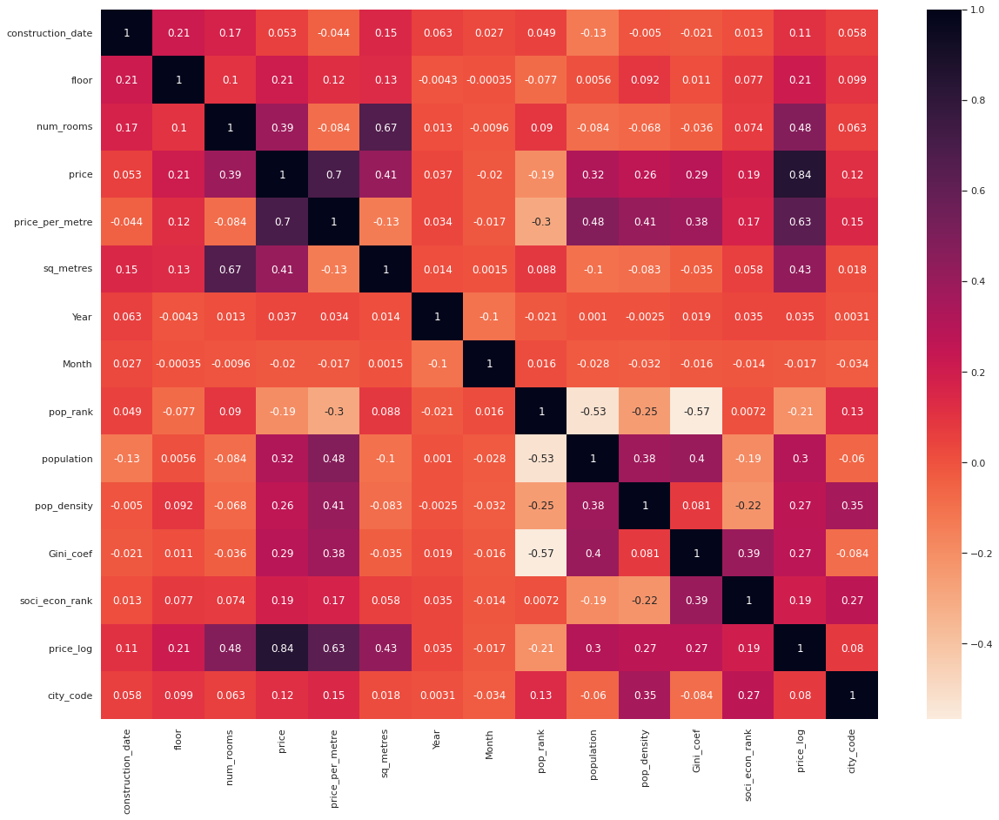

In [141]:
label=LabelEncoder()
dff=df40wik.to_dataframe()
dff['city_code'] = label.fit_transform(dff['city'])
label=LabelEncoder()
#dff['const_code'] = label.fit_transform(dff['construction_date'])
corr = dff.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corr, annot=True,cmap="rocket_r")

The heat map show the obious relations for example square meter , number of rooms - this is not enough for running prediction - Lets use ads text to extract addtional features

In [142]:
sc=sf1.groupby (['city','Year','Month'],{"Avr price": agg.AVG('price')})
scdf= sc.to_dataframe ()
fig = px.scatter(scdf, y="Month", x="city",size='Avr price',hover_data=['Year'],color = 'Year',title="Average monthly price view for 40 top cities")
fig.show()


real state price prediction Real state up to data is hard to find and usually the data is unstructured. we decide to use 1) 2)advertisement on web site

Real state Ads - How fast real states are sold?

How fast real states are sold? 
What is the average duration in days to sell a real state?
is there a big difference in the average number of days between the cities?
Does the city’s socio-economic ranking impact the duration?

To answer this question we did scraping to the real state ads from the 


## Cities Interactive Map

In [143]:
g = sf1.groupby(["city"], {"Count": agg.COUNT(),"Avr price": agg.AVG('price_per_metre'),'AVR sqr meter':agg.AVG('sq_metres')})
f=g.join(citydfsf,'city',how='inner')

geolocator = Nominatim(user_agent="miri")
f2df=f.to_dataframe()
f2df['city'] =f2df['city'].astype(str)

for i in range(len(f2df)) :
    
    location = geolocator.geocode (f2df.loc[i, "city"])
    if location:
        f2df.loc[i,'lat']=location.latitude
        f2df.loc[i,'lon']=location.longitude        
   

In [144]:
colorsl= ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'pink','darkpurple', 'white', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
def color(range):
  if range > 0 and range < len (colorsl):
    return colorsl[range]
  else:
    return "black"


Do cities rank related to their geogrphic location ?
Lets combine the data from the Nominatim and the socio ecomey rank from Wikipedia
and draw the cities with a differnt color per rank

In [145]:

m = folium.Map(location=[32.071072, 34.779832], zoom_start=8) 
f2df = f2df[f2df['lat']!='']
for index, location_info in f2df.iterrows():
    text= location_info["city"] + " " +location_info["soci_econ_rank"]
    folium.Marker([location_info["lat"], location_info["lon"]], popup=text,icon=folium.Icon(color=color(int(location_info["soci_econ_rank"])))).add_to(m)
m

 Start from here for the map
 

In [148]:
f2df.head(3)


,city,Count,Avr price,AVR sqr meter,name_type,district,pop_rank,population,pop_density,Gini_coef,soci_econ_rank,lat,lon
0,ירושלים,3407,24.731794,97.318756,עירייה,ירושלים,1,966346,7705,0.4405,3,31.795924,35.211981
1,תל אביב יפו,801,35.900754,99.414482,עירייה,תל אביב,2,468809,9045,0.5030,8,32.085300,34.781806
2,חיפה,1594,16.039063,99.377666,עירייה,חיפה,3,282751,4372,0.4906,7,32.819122,34.998386


In [149]:
f2df['soci_econ_rank'] =f2df['soci_econ_rank'].astype(int)
f2df['pop_rank'] =f2df['pop_rank'].astype(int)
f2df['pop_density'] =f2df['pop_density'].astype(float)
f2df['population'] =f2df['population'].astype(float)
f2df['Gini_coef'] =f2df['Gini_coef'].astype(float)
f2df['population'] = f2df['population'] / 1000

f2df.shape

(39, 13)

In [150]:

alt.renderers.enable('default')
text = ''

my_map4 = folium.Map(
    location=[32.071072, 34.779832],
    zoom_start=8,
    width='90%',
    height='90%',
    control_scale=True,
)
for index, location_info in f2df.iterrows():
  
  citydfp= dfcitypermonth[dfcitypermonth['city']==location_info["city"]] 

  citydfp=citydfp[citydfp['Year']!= 2021]
  altdf = citydfp [['Month','Year','Avr price']]
  #altdf=altdf.to_dataframe()
  altdf['Avr price']= altdf['Avr price'].round(2)
  p=altdf.pivot(index='Month', columns='Year', values='Avr price')

  if p.shape[0]!= 12:
    continue
  p['x']=pd.RangeIndex(start=1,stop = 13, name='x')
  p.set_index('x', inplace=True)
  source = p.reset_index().melt('x', var_name='year', value_name='y')
  # Create a selection that chooses the nearest point & selects based on x-value
  nearest = alt.selection(type='single', nearest=True, on='mouseover',
                          fields=['x'], empty='none')

  # The basic line
  gini= round(location_info["Gini_coef"], 2) 
  titlestr = " מחיר ממוצע " + location_info["city"] +  " דרוג " + str(location_info["soci_econ_rank"]) +" אוכלוסיה" + str(int (location_info["population"])) 
  line = alt.Chart(source).mark_line(interpolate='basis').encode(
      x='x:Q',
      y='y:Q',
      color='year:N'
  ).properties(title=titlestr)

    # Transparent selectors across the chart. This is what tells us
  # the x-value of the cursor
  selectors = alt.Chart(source).mark_point().encode(
      x='x:Q',
      opacity=alt.value(0),
  ).add_selection(
      nearest
  )

  # Draw points on the line, and highlight based on selection
  points = line.mark_point().encode(
      opacity=alt.condition(nearest, alt.value(1), alt.value(0)))

  # Draw text labels near the points, and highlight based on selection
  text = line.mark_text(align='left', dx=5, dy=-5).encode(
      text=alt.condition(nearest, 'y:Q', alt.value(' ')))

  # Draw a rule at the location of the selection
  rules = alt.Chart(source).mark_rule(color='gray').encode(
      x='x:Q',
  ).transform_filter(nearest)

  # Put the five layers into a chart and bind the data
  c=alt.layer(
      line, selectors, points, rules, text).properties(width=300, height=200)
  place = [location_info["lat"], location_info["lon"]] 
  circ_mkr = folium.CircleMarker(
    location=place,
    radius=12,
    #color='red',
    color = color(int(location_info["soci_econ_rank"])),
    fill=True,
    fill_color='blue',
    fillOpacity=1.0,
    opacity=1.2,
    tooltip=location_info["city"],
    popup=folium.Popup(max_width=600).add_child(
        folium.VegaLite(c, width=400, height=200)),)
  
  circ_mkr.add_to(my_map4)  
print ("Map in Ready")  

Map in Ready


In [151]:
my_map4

# Real estate Ads ( In Hebrew )


1.   How fast real estates are sold? 
2.   What is the average duration in days to sell a real estate? is there a big difference in the average number of days between the cities? Does the city’s socio-economic ranking impact the duration?
3.  Ads text for feature Creation for real estate Price Prediction
4.  Adds difference between inexpensive and the “expensive” real esate 
5. Feature imporatnce - what impact the price prediction?




(18907, 14)
(14661, 14)


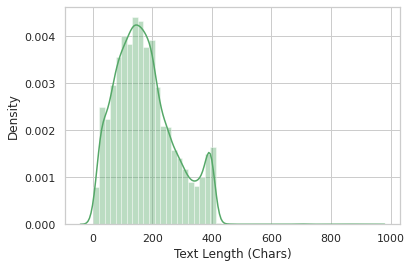

In [153]:
## Start text processing and cleaning

df=pd.read_csv("miriads.csv")
stop_words_set =  ['לא','דירה','דירת','מר','ללא','דירה','יש','מטר','מכירה','למכירה','עם','מ','ר' ,'ש','על','דירות','ברחוב' ,'מטר']
df['maintext'] = df['maintext'].astype(str)
df['text_normalized'] = df['maintext'].apply(remove_html_tags)
df['text_normalized'] = df['text_normalized'].apply(lambda x: normalize_text(x, stop_words_set, True))
print (df.shape)
df =  df.dropna(subset=['maintext'])
# removing ads with no text
df=df[df['maintext']!= 'nan']
print (df.shape)
df['created'] = df['created'].apply(lambda dt_str: get_datetime(dt_str))
df['last_published'] = df['last_published'].apply(lambda dt_str: get_datetime(dt_str))
df['diff'] = df['last_published'] - df['created']
df['Year'] = df['created'].apply(lambda dt: dt.year) # created year 
df['diff'] =df['diff'].astype(str)
days = re.compile(r"(\d+)")
#g['all_text'] = g['posts_list'].apply(lambda l: ' '.join(l))
df['diffnum'] = df['diff'].apply (lambda l:days.findall(str(l))[0])
df['diffnum'] =df['diffnum'].astype(int)
df['length'] = df['maintext'].apply(lambda t: len(t))
df['words_num'] = df['maintext'].apply(lambda t: len(t.split()))
df['price'] = df['price']/1000
sns.distplot(df['length'], axlabel="Text Length (Chars)", color='g')

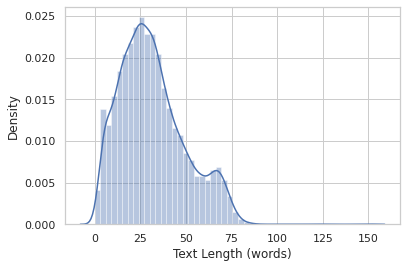

In [154]:
sns.distplot(df['words_num'], axlabel="Text Length (words)", color='b')

## How fast real estates are sold?
Each ad as a created date and last publish date.
We used this feature to understand how fast real estate sales



 mu = 283.77 and sigma = 206.88



Text(0.5, 1.0, 'Number of days published distribution')

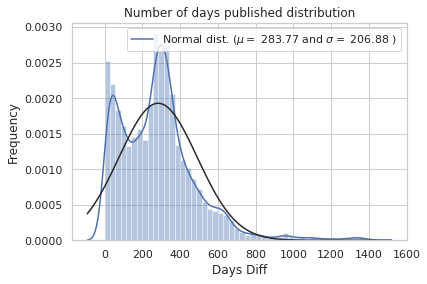

In [155]:
sns.distplot(df['diffnum'], axlabel="Days Diff", color='b' , fit=norm);
(mu, sigma) = norm.fit(df['diffnum'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Number of days published distribution')


 mu = 246.82 and sigma = 149.83



Text(0.5, 1.0, 'Number of days published distribution')

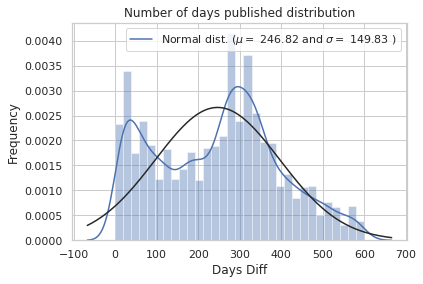

In [156]:
dfc = df[df['diffnum'] < 600]
sns.distplot(dfc['diffnum'], axlabel="Days Diff", color='b' , fit=norm);
(mu, sigma) = norm.fit(dfc['diffnum'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Number of days published distribution')

This look better now and average days for an ads is ~8-9 months

## City - days to sale , socio economy and population
The Average days to sell real estate per city with combined with city socio economy rank and population rank ( From the Wiki scarping above)

In [157]:
fdiff=df.groupby('city',as_index=False)['diffnum'].mean() #f
fdiffsc=tc.SFrame(fdiff)
fdiffc=fdiffsc.join(citydfsf,'city',how='inner')
fig = px.scatter(fdiffc.to_dataframe(), x="city", y="soci_econ_rank", color="pop_rank",
                 size='diffnum', hover_data=['city'])
fig.show()

## Uni Grams - Most popular words in Ads

[('חדרים', 6300), ('מרפסת', 4158), ('מטר', 2939), ('חדר', 2908), ('בית', 2737), ('מטבח', 2667), ('נוף', 2581), ('למכירה', 2387), ('קומה', 2291), ('הורים', 2234), ('חניה', 2092), ('מחסן', 2051), ('חדש', 2023), ('מאוד', 2023), ('הדירה', 1982), ('גדולה', 1933), ('משופצת', 1860), ('יחידת', 1783), ('שמש', 1750), ('בכל', 1665)]


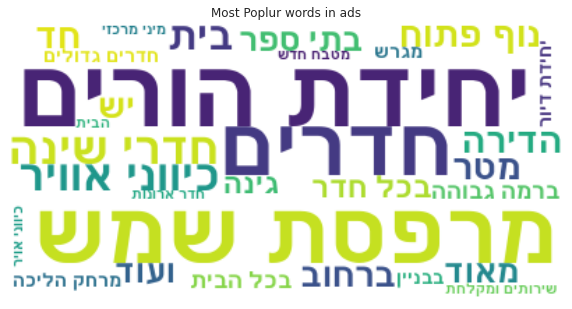

In [ ]:
blog_post= " ".join( df['text_normalized'])
re_words = re.compile(r"(\w+)")
l = re_words.findall(blog_post)
l = [w for w in l if w not in stop_words_set]
c = Counter(l)
print (c.most_common(20))
bidi_text = get_display(blog_post)
plt.figure(figsize=[10,10])
wordcloud = WordCloud(font_path='FreeSansBold.ttf',max_words=30,stopwords = stop_words_set, background_color ='white').generate(bidi_text)
plt.imshow(wordcloud,interpolation='bilinear')
plt.title("Most Poplur words in ads")
plt.axis("off")
plt.show()

## Bi Grams - Most popular words in Ads

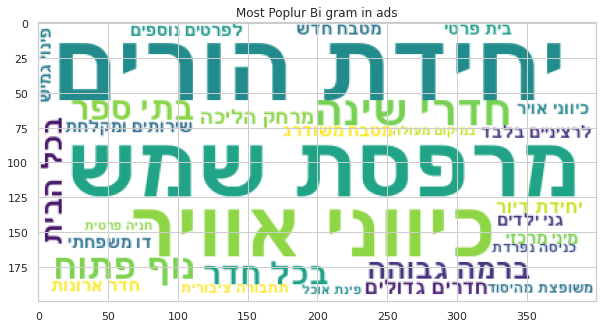

In [ ]:
def get_most_common_bigrams(txt):
    words = word_tokenize(txt)
    bigrams = [f"{w1} {w2}" for w1,w2 in zip(words, words[1:])]
    c = Counter(bigrams)
    return c

txt = "\n".join(df['text_normalized'])
bidi_text = get_display(txt)
d = get_most_common_bigrams(bidi_text)
wordcloud = WordCloud(font_path='FreeSansBold.ttf',max_words=30,stopwords = stop_words_set,background_color ='white').generate_from_frequencies(d)
plt.figure(figsize=[10,10])
plt.title("Most Poplur Bi gram in ads")
plt.imshow(wordcloud)


In [ ]:
#Another view to understand the data
l = sorted(d.items(), key=operator.itemgetter(1), reverse=True)
l= l[:25]
font_path = 'FreeSansBold.ttf'  # Your font path goes here
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()
n_groups = len(l)
vals_films = [x[1] for x in l]
legends_films = [get_display(x[0]) for x in l]
fig = px.bar(x= legends_films,y= vals_films,color=vals_films)
fig.show()

## TF-IDF , expensive, inexpensive real estate Ads

 Is there  a difference in the text of inexpensive and expensive real estate?

In [158]:
dfd1=df[df['price']!=0 ]
dfd1=dfd1.sort_values(by='price', ascending=False)
dfd1=dfd1[['text_normalized','sq_meter','price','city','diffnum','Year','address','num_rooms','balcony','length','words_num']]
dfd1['clean_text'] =dfd1['text_normalized'].apply(lambda l: re.sub(r'\d+', '', l))
dfd1['maintext'] =dfd1['text_normalized'].astype(str)
dfd1['city'] =dfd1['city'].astype(str)

  
  
We run tf-idf hyper paramters: Min df  this would likely exclude words like a particular street name o. Max_df, on the other hand, defines the maximum number of documents in which a word can appear. This prevents words which appear in almost all ads. 

In [159]:
def highandlowtf (data):
  vectorizer = TfidfVectorizer(min_df=0.03 , max_df=.90,stop_words=stop_words_set)
  tfidf_wm = vectorizer.fit_transform(data['clean_text'] )
  tfidf_tokens = vectorizer.get_feature_names_out ()
  df_tfidfvect = pd.DataFrame(data = tfidf_wm.toarray(),columns = tfidf_tokens)
  tfh=sorted(list(zip(vectorizer.get_feature_names_out(), 
                                              tfidf_wm.sum(0).getA1())), 
                                  key=lambda x: x[1], reverse=True)[:20]
  print (tfh)     
  tfl=sorted(list(zip(vectorizer.get_feature_names_out(), 
                                              tfidf_wm.sum(0).getA1())), 
                                  key=lambda x: x[1])[:20]
  print (tfl)     
  return (tfh,df_tfidfvect)

[('חדרים', 967.0708597935646), ('של', 720.5005758124013), ('מרפסת', 720.136160324255), ('קומה', 630.031795246962), ('בית', 593.1974991277322), ('נוף', 573.6710804662423), ('חדר', 532.449173983921), ('מטבח', 484.1717103952984), ('משופצת', 483.61843296782286), ('חדש', 467.9721021379938), ('מאוד', 460.26103043105365), ('חניה', 447.5713129515571), ('הדירה', 445.94540707783915), ('גדולה', 433.8922734752432), ('מחסן', 428.43191445123415), ('הורים', 417.81809145983675), ('מעולה', 405.3690858079291), ('שמש', 401.25189038660704), ('במיקום', 398.4553709757841), ('מגרש', 398.3175501918946)]
[('אוכל', 121.39794494123964), ('דלתות', 131.08811685492788), ('מיזוג', 131.5114211331489), ('פינת', 131.9085854071081), ('גנים', 132.34203102816267), ('תת', 136.2205520224833), ('ומקלחת', 137.65395749821985), ('מערב', 137.6764905763175), ('משודרג', 138.80051669052054), ('כנסת', 139.57307671767364), ('לרציניים', 142.5704416467668), ('מיני', 144.28248154699384), ('עד', 144.95062950663842), ('שני', 145.052531891

Text(0.5, 1.0, 'Word with high tf idf score (sum for all ads)')

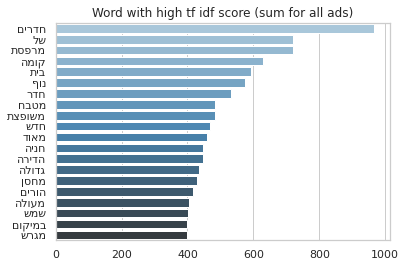

In [160]:
(tfh,df_tfidfvectall)= highandlowtf(dfd1)
df = pd.DataFrame(tfh, columns =['score', 'word'])
df['wordr'] = df['score'].apply(lambda t: t[::-1])
sns.barplot (df['word'].to_list(),df['wordr'].to_list(),palette="Blues_d")
plt.title('Word with high tf idf score (sum for all ads)')

Expensive - we definde the expensive real state -  as the 2% real esate with most expensive price 

274
[('בית', 21.285491194129577), ('של', 20.587671388634686), ('מגרש', 14.425445768595594), ('בנוי', 14.056640593546764), ('נוף', 13.065900102221478), ('בריכה', 12.743340204501328), ('במיקום', 11.440287916814071), ('לים', 11.261095068865435), ('דונם', 10.846552823257472), ('מרפסת', 9.751607198376211), ('חדר', 9.68417861309733), ('נכס', 9.596060543097716), ('חניות', 9.191303770328554), ('שקט', 9.1220245879225), ('פנטהאוז', 8.977667336483918), ('מרפסות', 8.804561240096195), ('וילה', 8.729961453490512), ('חדרים', 8.565768073050258), ('חדרי', 8.387328653624838), ('גבוהה', 8.290585081770928)]
[('שחר', 2.3175880136089386), ('בקומת', 2.3424404397934273), ('לובי', 2.396175872432685), ('מחסן', 2.4120246572802775), ('לשירותכם', 2.4266393553745886), ('שמירה', 2.470284540157962), ('יציאה', 2.5481883671705723), ('לנוף', 2.574598709498491), ('גבוהות', 2.604635650019922), ('אדריכלית', 2.635162484382871), ('שמש', 2.6470564713576064), ('עיצוב', 2.656380191649854), ('בעיצוב', 2.7080750121379573), ('ושקט

Text(0.5, 1.0, 'Word with high tf idf score for expensive real estate')

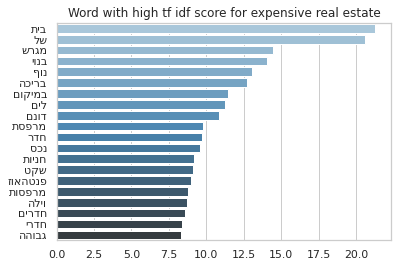

In [161]:
dfdp=dfd1.sort_values(by='price', ascending=False)
per5 = int(dfdp.shape[0]* 0.02)
print (per5)
expdf = dfdp[0:per5]
(tfh,df_tfidfvect)= highandlowtf(expdf)
df = pd.DataFrame(tfh, columns =['score', 'word'])
df['wordr'] = df['score'].apply(lambda t: t[::-1])
sns.barplot (df['word'].to_list(),df['wordr'].to_list(),palette="Blues_d")
plt.title('Word with high tf idf score for expensive real estate')

Nice ... we can see new words comapre to above 
Words like "וילה ,פנטהאוז , בריכה " 

Cheapest Expensive - we definde the cheapest real estate - as the 2% real esate with lower   price

274
[('קרקע', 24.06960786253951), ('גוש', 22.050590971779183), ('חלקה', 21.447699361206382), ('מגרש', 16.274467345637742), ('של', 16.113182443215152), ('חקלאית', 15.23424150327729), ('חקלאי', 14.907123092041992), ('דונם', 14.569313410799472), ('בטאבו', 13.189579847715695), ('להשקעה', 11.012653439212439), ('פרטית', 10.979025631169119), ('קומה', 10.546536340464291), ('שח', 9.848452652227296), ('מעולה', 8.87461628984636), ('בגוש', 8.792678291082606), ('הקרקע', 8.524283421919732), ('לבניה', 8.503643106730847), ('לדירה', 8.446559191626896), ('שטח', 8.340350364617976), ('חדרים', 8.118277279863587)]
[('לרכוש', 3.209817321526937), ('מס', 3.3495007739912497), ('רק', 3.408125591553378), ('כרגע', 3.5910382618560766), ('הסכם', 3.7485706754416284), ('בשבת', 3.8069107546555077), ('הים', 3.8088286532971436), ('מגורים', 3.8091302040093864), ('לאחר', 3.8440412399431527), ('תכנית', 4.039260708735584), ('לבנייה', 4.085511657847407), ('משרד', 4.112899481505377), ('העיר', 4.122379175785057), ('שיתוף', 4.13

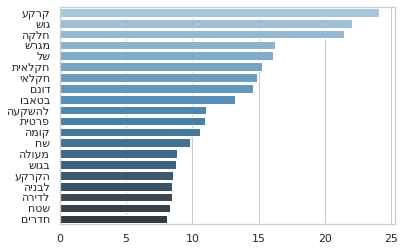

In [162]:
dfdp=dfd1.sort_values(by='price')
per5 = int(dfdp.shape[0]* 0.02)
print (per5)
chpdf = dfdp[0:per5]
(tfh,df_tfidfvect)= highandlowtf(chpdf)
df = pd.DataFrame(tfh, columns =['score', 'word'])
df['wordr'] = df['score'].apply(lambda t: t[::-1])
sns.barplot (df['word'].to_list(),df['wordr'].to_list(),palette="Blues_d")

## Model to predict price

 XG-Boost model

In [165]:
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler, MaxAbsScaler, Binarizer, MinMaxScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
selected_features = ['city', 'num_rooms','balcony', 'diffnum', 'length', 'words_num','sq_meter','price']

sparse_features =['city', 'num_rooms','balcony']     

#sf_selected = dfdnorm[selected_features]
sf_selected = dfd1[selected_features]
for feat in sparse_features:
  lbe = LabelEncoder()
  sf_selected[feat] = lbe.fit_transform(sf_selected[feat])
print ("Done ")

#df_selected = sf_selected.to_dataframe()

#ord_features = df_selected[['city', 'num_rooms','empiric_calibrated_recs', 'empiric_clicks', 'user_recs', 'user_clicks', 'user_target_recs', 'time_of_day']]
#data = ord_features
num_feat = ['price', 'diffnum', 'length', 'words_num','sq_meter']

scaler = MinMaxScaler()

sf_selected[num_feat] = scaler.fit_transform(sf_selected[num_feat])
scaled_features = StandardScaler().fit_transform(df_tfidfvectall.values)
scaled_features_df = pd.DataFrame(scaled_features, index=df_tfidfvectall.index, columns=df_tfidfvectall.columns)
sf_selected = pd.concat([sf_selected, df_tfidfvectall], axis=1, join="inner")
sf_selected.dropna(inplace = True)
target = sf_selected['price'].reset_index(drop=True)

Done 


In [166]:
X_train, X_test, y_train, y_test = train_test_split(sf_selected, target, random_state=42, test_size = 0.2)
X_train.drop(columns=['price'],inplace=True)
X_test.drop(columns=['price'],inplace=True)

In [167]:
X=X_train
y=y_train
model = GradientBoostingRegressor
    # Perform Grid-Search
gsc = GridSearchCV(
        estimator=model(),
        param_grid={
            'learning_rate': [0.01, 0.1, 0.2, 0.3],
            'n_estimators': [100, 300, 500, 1000],
        },
        cv=5,
        scoring='neg_mean_squared_error',
        verbose=0,
        n_jobs=-1)

    # Finding the best parameter
grid_result = gsc.fit(X, y)
best_params = grid_result.best_params_
    # Random forest regressor with specification
gb = model(learning_rate=best_params["learning_rate"],
               n_estimators=best_params["n_estimators"],
               random_state=False,
               verbose=False)
    # Apply cross validiation on the model
gb.fit(X, y)
    

GradientBoostingRegressor(n_estimators=500, random_state=False, verbose=False)

In [168]:
b= gb.score(X_test, y_test)
print (b)

0.4939009766111212


Not the bext score - Lets check the feature imporatnce 

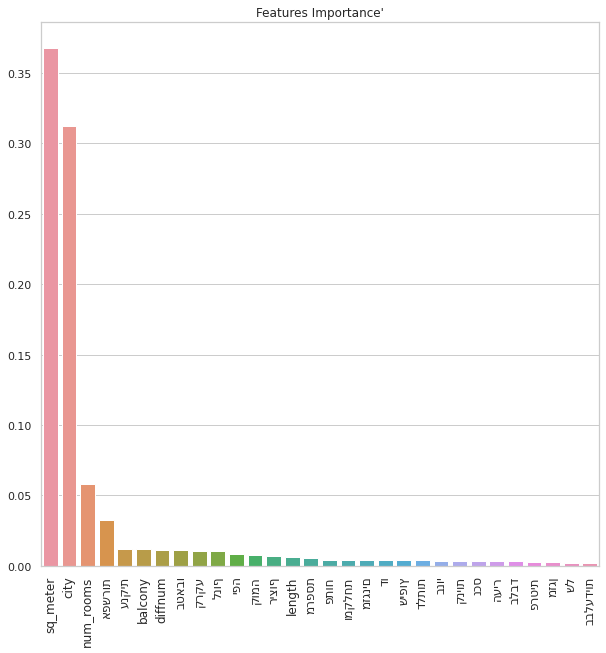

In [170]:
importances = gb.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
sorted_indices=sorted_indices[0:30]
sorted_imp = np.sort(importances)[::-1]
sort_imp = sorted_imp[0:30]
plt.figure(figsize=[10,10])
g = sns.barplot(X_train.columns[sorted_indices], sort_imp)
g.set_title ("Features Importance'")
for label in g.get_xticklabels():
    label.set_rotation(90) 
    label.set_fontsize('medium')

From the char we see that the most imporatnt variables are square meter , the city , number of room and the words "אפשרות " וענקית .

# Scraping data from the website https://www.ad.co.il/



1.   Real state Ads - two stage - first scrape ads list , second get each ad and scarpe the data
2.   Real state sales - simple html table scrape (For this i used the script used by another team )



Real state Ads - two stage - first scrape ads list , second get each ad and scarpe the data

In [ ]:
def get_ad_data(url):
    html = requests.get(url).content.decode('utf-8')
    soup = BeautifulSoup(html, 'html.parser')
    ad_list=[]
    adscards = soup.find('div', {'class': 'cards-wrap s m l'})

    for ad in adscards.find_all('div', {'class': "card-block"}):
        c = ad.get('data-id')
        ad_list.append(c)
    return ad_list

def scarpeadslist (start, end):
  
    urlgen = lambda num: f'https://www.ad.co.il/nadlansale?pageindex={num}'
    adl=[]
    adl = get_ad_data(urlgen(start))
    for progress, i in enumerate(tqdm(range(start + 1, end))):
        time.sleep(np.random.rand())
        adl.extend(get_ad_data(urlgen(i)))
        if progress % 50 == 1:
            print ("Size :",len(adl),i) 
            df = pd.DataFrame(adl)
            df.to_csv('realestaten_ads.csv', index=False)
    df.to_csv('realestaten_ads.csv', index=False)


scarpeadslist(1,1000)

In [ ]:
df=pd.read_csv("realestaten_ads.csv")
df1=df.copy()

def parse_alink(a): 
      b = a['href']
      return a['href']

k=0
 ########## Get from the ad list
for i, r in df.iterrows():
      time.sleep(np.random.rand())
      num = r[0]  # https://www.ad.co.il/ad/13214747
      #print (num)
      urlgen = lambda num: f'https://www.ad.co.il/ad/{num}'
      #print (urlgen(num))
      html = requests.get(urlgen(num)).content.decode('utf-8')

      soup = BeautifulSoup(html, 'html.parser')
     
      title  = soup.find('div', {'class': 'd-flex justify-content-between'})
      
      if title: 
        h2 = title.find_all('h2')
        df1.loc[i,'title'] = h2[0].text
        if (len(h2)== 2):
          df1.loc[i,'price']  = h2[1].text[:-1].replace(',', '')
        else:
          df1.loc[i,'price'] =0 
        
        maintext =""
        created=""
        last_published=""
         
        maintext = soup.find('p', {'class': 'text-word-break'})
        if maintext:
            #print(maintext)
            df1.loc[i,'maintext'] = maintext.text
        else:
            df1.loc[i,'maintext'] = title.text  

        tr1 = soup.find_all('div', {'class': 'px-3'})
        df1.loc[i,'created'] = tr1[0].text[13:]
        df1.loc[i,'last_published']  = tr1[1].text[18:]
        tr= soup.find ('table', {'class': 'table table-sm mb-4'})
        new_table = pd.DataFrame(columns=range(0,2), index = [0]) # I know the size 
        row_marker = 0
        column_marker = 0
        columns = tr.find_all('td')
        columnse = columns[::2]
        
        for column in columnse:
          if (column.get_text().strip(' \r\n') == "עיר"):
              df1.loc[i,'city']=columns[column_marker+1].text.strip(' \r\n')
          if (column.get_text().strip(' \r\n') == "כתובת"):
              df1.loc[i,'address']=columns[column_marker+1].text.strip(' \r\n')
          if (column.get_text().strip(' \r\n') == "חדרים"):
              df1.loc[i,'num_rooms']=columns[column_marker+1].text.strip(' \r\n')         
          if (column.get_text().strip(' \r\n') == "קומה"):
              df1.loc[i,'floor']=columns[column_marker+1].text.strip(' \r\n')   
          if (column.get_text().strip(' \r\n') == "שטח בנוי"):
              df1.loc[i,'sq_meter']=columns[column_marker+1].text.strip(' \r\n')
          if (column.get_text().strip(' \r\n') == "מרפסות"):
              df1.loc[i,'balcony']=columns[column_marker+1].text.strip(' \r\n')
          column_marker += 2
      if i  %  1000 == 0:
            df1.to_csv("adscrapn.csv", encoding='utf-8-sig')
            time.sleep(7)
            print (i,"****************")
         
     
df1.to_csv("adscrapn.csv",encoding='utf-8-sig')  

Real state sales - simple html table scrape (For this i used the script used by another team )

In [ ]:
root_logger = logging.getLogger()
root_logger.setLevel(logging.DEBUG)
handler = logging.FileHandler('realestate_scraper.log', 'w', 'utf-8')
root_logger.addHandler(handler)
#command line interface
parser = argparse.ArgumentParser()
parser.add_argument("--start", type=int)
parser.add_argument("--end", type=int)


def get_sale_data(url):
    html = requests.get(url).content.decode('utf-8')
    soup = BeautifulSoup(html, 'html.parser')
    res_dict = {'date': [], 'city': [], 'address': [], 'num_rooms': [], 'sq_metres': [], 'floor': [], 'price': [],
                'price_per_metre': [], 'construction_date': []}
    for tr in soup.find_all('tr')[1:]:
        tds = tr.find_all('td')
        res_dict['date'].append(tds[0].text)
        res_dict['city'].append(tds[1].text)
        res_dict['address'].append(tds[2].text)
        res_dict['num_rooms'].append(tds[3].text)
        res_dict['sq_metres'].append(tds[4].text)
        res_dict['floor'].append(tds[5].text)
        res_dict['price'].append(tds[6].text.replace(',', ''))
        res_dict['price_per_metre'].append(tds[7].text.replace(',', ''))
        res_dict['construction_date'].append(tds[8].text)
    return res_dict



def get_realstate_data(url):
    html = requests.get(url).content.decode('utf-8')
    soup = BeautifulSoup(html, 'html.parser')
    res_dict = {'date': [], 'city': [], 'address': [], 'num_rooms': [], 'sq_metres': [], 'floor': [], 'price': [],
                'price_per_metre': [], 'construction_date': []}
    for tr in soup.find_all('tr')[1:]:
        tds = tr.find_all('td')
        res_dict['date'].append(tds[0].text)
        res_dict['city'].append(tds[1].text)
        res_dict['address'].append(tds[2].text)
        res_dict['num_rooms'].append(tds[3].text)
        res_dict['sq_metres'].append(tds[4].text)
        res_dict['floor'].append(tds[5].text)
        res_dict['price'].append(tds[6].text.replace(',', ''))
        res_dict['price_per_metre'].append(tds[7].text.replace(',', ''))
        res_dict['construction_date'].append(tds[8].text)
    return res_dict

def main(start, end):
    urlgen = lambda num: f'https://www.ad.co.il/nadlanprice?pageindex={num}'
    mydict = get_sale_data(urlgen(start))
    for progress, i in enumerate(tqdm(range(start + 1, end))):
        time.sleep(np.random.rand())
        for (k1, v1), v2 in zip(mydict.items(), get_sale_data(urlgen(i)).values()):
            mydict[k1] += v2
        if progress % 50 == 1:
            df = pd.DataFrame.from_dict(mydict).drop_duplicates().fillna(np.nan)
            df['construction_date'] = df['construction_date'].astype('str')
            logging.debug(f'\nreached #{i}; last date: {df.iloc[-1]["date"]}\n')
            if Path('./realestate_data.csv').exists():
                df.to_csv('realestate_data.csv', index=False, mode='a', header=False, encoding='utf-8')
            else:
                #df.to_csv('realestate_data.csv', index=False, encoding='utf-8')
                df.to_csv('realestate_data.csv', index=False, encoding='utf-8-sig')

    df = pd.DataFrame.from_dict(mydict).drop_duplicates()
    df.to_csv('realestate_datamiri.csv', index=False, mode='a', header=False, encoding='utf-8')
    df.to_csv('realestate_datamiri6.csv', index=False, mode='a', encoding='utf-8-sig')


if __name__ == '__main__':
    args = parser.parse_args()
    #main(args.start, args.end)

    urlgen1 = "https://www.ad.co.il/nadlansale"
    html = requests.get(urlgen1)
    html = requests.get(urlgen1).content.decode('utf-8')
    soup = BeautifulSoup(html, 'html.parser')
    adscards = soup.find('div', {'class': 'cards-wrap s m l'})

    for ad in adscards.find_all('div', {'class': "card-block"}):
        print(ad)
        c=ad.get('data-id')
        print (ad.get('data-id'))
    main(1, 3000)
